In [21]:
%load_ext autoreload
%autoreload 2

import os 
import numpy as np
from matplotlib import pyplot as plt
from scipy import ndimage

from pySurf.data2D_class import Data2D
from pySurf.data2D import plot_data
from dataIO.fn_add_subfix import fn_add_subfix
from pySurf.fit_cylinder import fit_cylinder, fit_cone
from pySurf.points import resample_grid, subtract_points, plot_points, points_autoresample

from pySurf.readers.instrumentReader import matrix_reader, matrix4D_reader

from pySurf.scripts.dlist import Dlist,load_dlist

from plotting.backends import maximize
from dataIO.span import span

import inspect
import warnings
#warnings.filterwarnings('ignore')
np.set_printoptions(threshold=40)  #truncate arrays longer than 40

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


Voglio fare vedere come usare questa libreria.

L'oggetto principale e' `Data2D`, rappresenta una superficie con assi associati.
E' una libreria python, quindi ha tutte le feature del python, ad posso ispezionarne gli oggetti con `?`.

In [23]:
Data2D?


Init signature:
Data2D(
    data=None,
    x=None,
    y=None,
    file=None,
    reader=None,
    units=None,
    name=None,
    *args,
    **kwargs,
)
Docstring:     
A class containing 2d data with x and y coordinates. It has a set of methods for analysis operations.
Function methods: return a copy with new values.
to use as modifier (procedure), e.g.:
    a=a.level() 
Init docstring:
can be initialized with data; data,x,y; file; file, x, y.
if x and y are provided, they override x and y if matching number of elements, or used as range if two element.
File:           c:\users\kovor\documents\python\pyxtel\pysurf\data2d_class.py
Type:           type
Subclasses:     PSD2D


Come vediamo puo' essere inizializzato con data,x,y e tante altre cose. Tipicamente pero' vorremo leggere dati da qualche file.
C'e' un'argomento reader per selezionare una funzione per leggere i dati, ve ne sono per molti comuni strumenti e formati, o puo' essere implementata custom.
Se il reader non e' passato esplicitamente, prova ad indovinare il formato, ed in genere ci azzecca abbastanza. 



In [22]:
fn = r'G:\My Drive\progetti\ion_beam\specchio_beatrix\exemplar_data\MFT-txt\EN4-2-100.txt'
fn2 = r'G:\My Drive\progetti\c_overcoating\esperimenti\20200214_batch2_IrC\20200306_MFT_calibration\01_18803_A.csv'

In [37]:
d = Data2D(fn2) 
print ("Return object", d)

first argument is string, use it as filename
Return object <pySurf.data2D_class.Data2D object at 0x00000296AA311198>


Posso provare ad elencare i metodi della classe (ad esempio, esiste un metodo `plot`, cosa fara'?!):

In [24]:
print([d for d in dir(Data2D) if d[:2] != '__'])

['align_interactive', 'apply_to_data', 'apply_transform', 'copy', 'crop', 'histostats', 'level', 'load', 'plot', 'printstats', 'psd', 'remove_nan_frame', 'remove_outliers', 'resample', 'rot90', 'rotate', 'save', 'slope', 'std', 'topoints', 'transpose', 'update_wrapper']


Quindi proviamo a leggere qualche dato (salvato da MFT in formato testo):

first argument is string, use it as filename


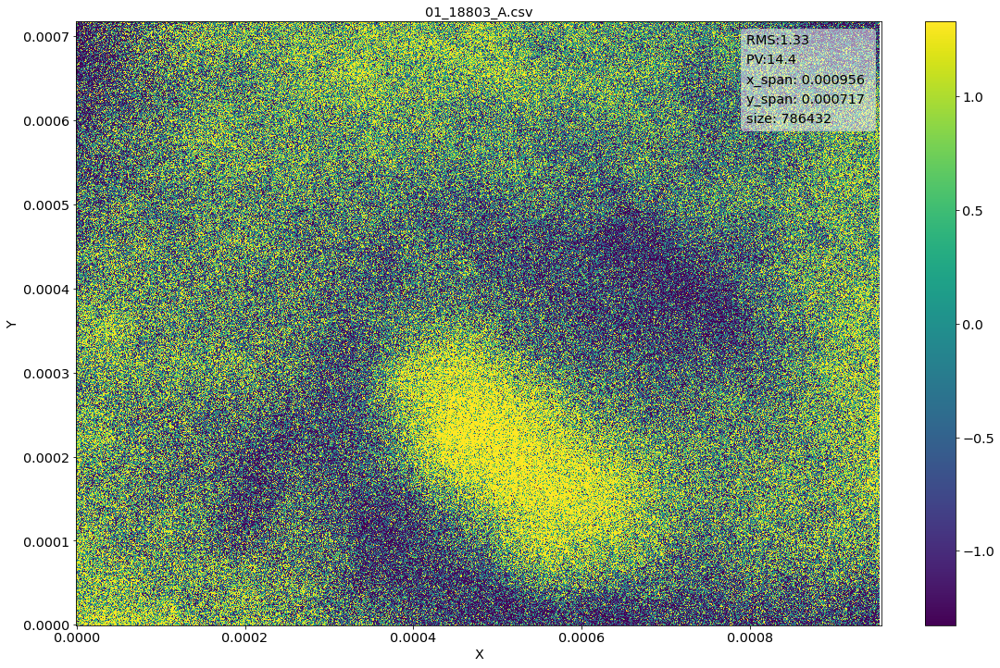

In [25]:
d.plot()

Notiamo tuttavia che le unita' degli assi sono scomode (ed ignote), vorrei anche collocare il centro dell'immagine sull'origine (potrebbe pero' essere ovunque).
I can also invert y axis to match format specs:

first argument is string, use it as filename


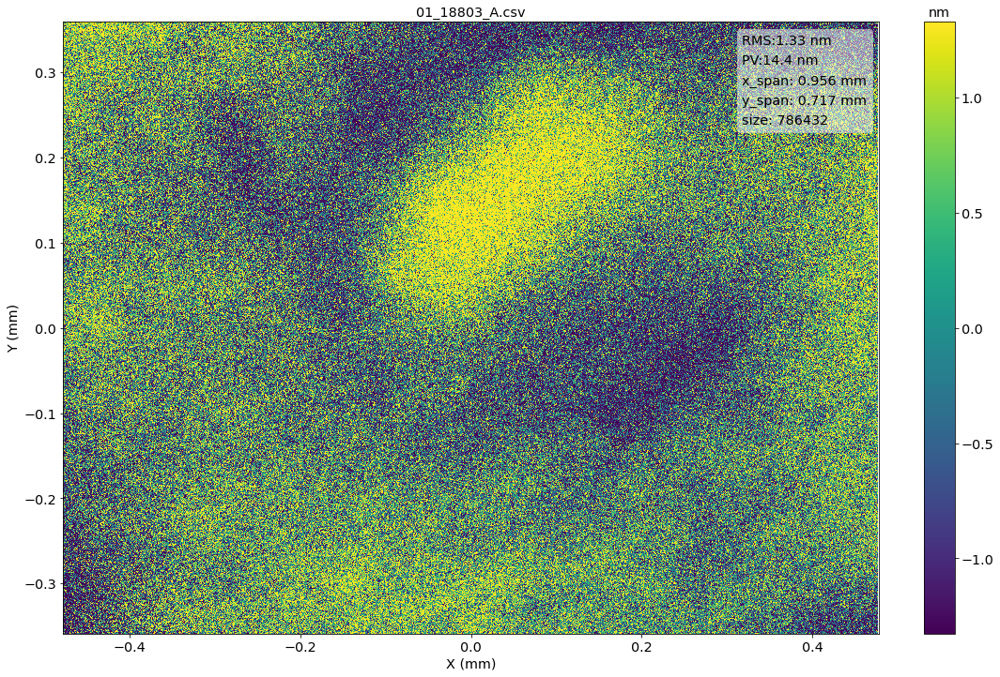

In [26]:
d = Data2D(fn2,units=['mm','mm','nm'],center=(0,0),scale=(1000,-1000,1))  #this matches exactly Gwyddion
d.plot()

This is an example of how I can read a simple matrix csv file, passed by a colleague, that was stripped of the header and has an arbitrary delimiter, scale (correct by wavelength), etc. 

first argument is string, use it as filename
fileformat ``.txt``not recognized for file G:\My Drive\progetti\ion_beam\specchio_beatrix\exemplar_data\MFT-txt\EN4-2-100.txt
Use generic text reader


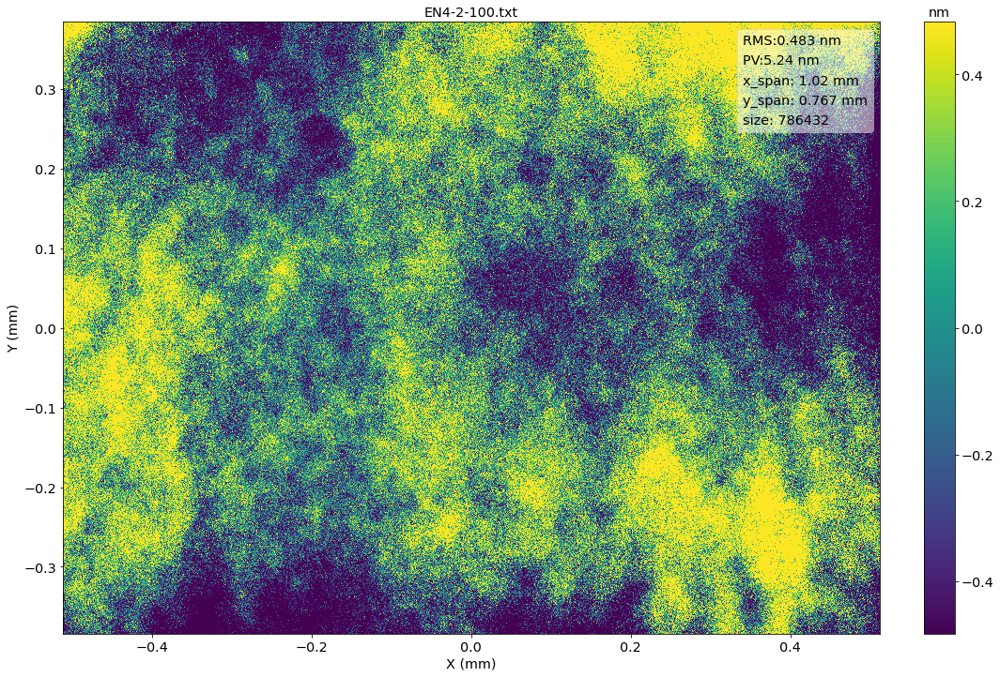

In [27]:
d2 = Data2D(fn,units=['mm','mm','nm'],center=(0,0),matrix=1,delimiter='',scale=(0.001,0.001,635.)) #this matches exactly MFT software
d2.plot()

Riguardo ai plot (ed in generale quando possibile agli altri metodi), posso passare normali argomenti python, ad es. cambiare titolo e assi.
Posso salvare la figura con i normali metodi python (quindi di conseguenza molte soluzioni si trovano su stackoverflow).
Ad esempio per cambiare palette e scala colori:

Text(0.5, 1.0, 'surface of data')

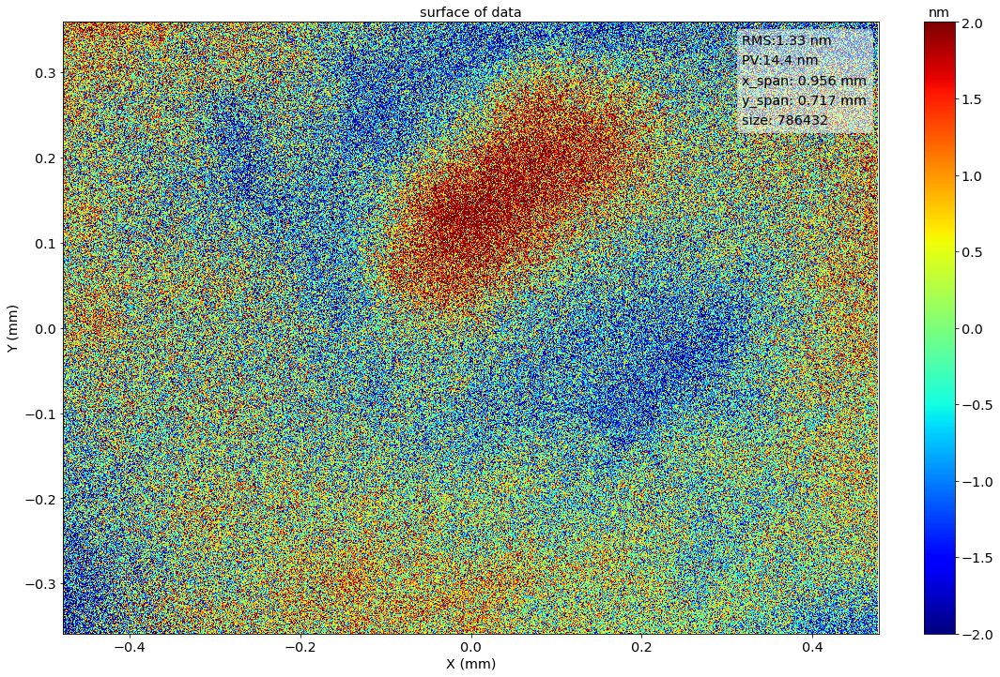

In [33]:
d.plot(vmin=-2,vmax=+2,cmap=plt.get_cmap('jet'))
plt.title('surface of data')

The returned object represents a set of data and axis. These can be returned calling the object itself:

In [34]:
d()

(array([[-3.683  , -0.3302 , -2.1082 , ..., -0.9525 ,      nan,      nan],
        [ 2.8067 ,  0.9144 , -2.55905, ..., -0.01905,      nan,      nan],
        [-1.2192 , -1.1938 , -1.47955, ...,  1.46685,      nan,      nan],
        ...,
        [ 0.8128 ,  0.51435,  1.78435, ..., -0.04445,      nan,      nan],
        [ 2.2987 ,  0.60325, -1.02235, ...,  0.83185,      nan,      nan],
        [ 2.159  , -0.34925,  1.5367 , ..., -1.75895,      nan,      nan]]),
 array([-0.4779096 , -0.47697527, -0.47604094, ...,  0.47604094,
         0.47697527,  0.4779096 ]),
 array([-0.3584322 , -0.35749756, -0.35656293, ...,  0.35656293,
         0.35749756,  0.3584322 ]))

But can also be represented with x,y,z points:

In [66]:
d.topoints()

array([[-0.4779096 , -0.3584322 , -3.683     ],
       [-0.47697527, -0.3584322 , -0.3302    ],
       [-0.47604094, -0.3584322 , -2.1082    ],
       ...,
       [ 0.47604094,  0.3584322 , -1.75895   ],
       [ 0.47697527,  0.3584322 ,         nan],
       [ 0.4779096 ,  0.3584322 ,         nan]])

Functions (not yet classes) to manipulate data points in 3-coordinate format are available in module `points`.

## Analysis functions

Qualche semplice analisi (in realta' la funzione e' ancora un po' grezza, mandatemi pure feedback e richieste).

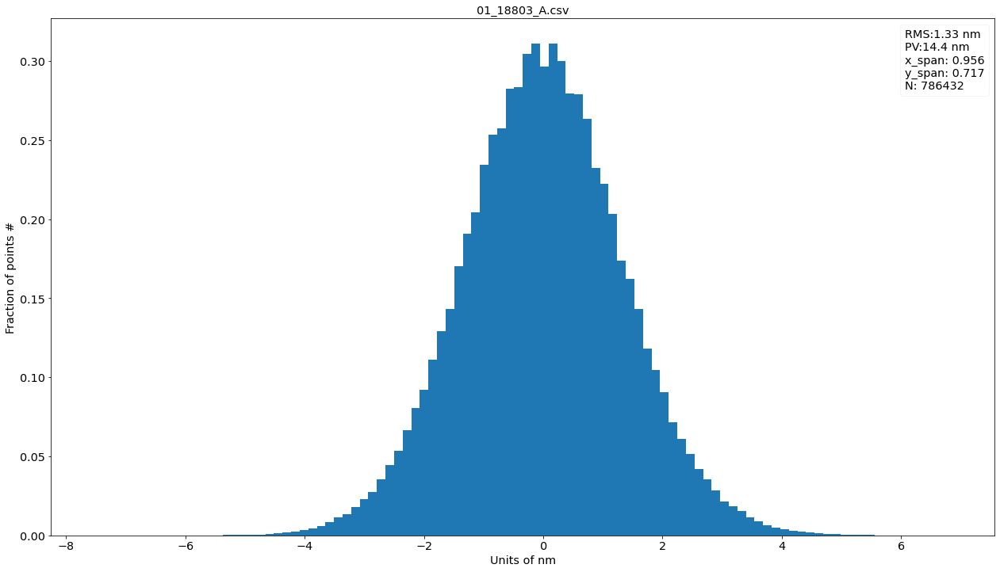

In [84]:
h1 = d.histostats()

Se proprio vogliamo strafare (in realta' la funzione e' ancora un po' grezza, mandatemi pure feedback e richieste).

C:\Users\kovor\Documents\python\pyXTel\dataIO\outliers.py:35: RuntimeWarning: invalid value encountered in less
  mask=mask & (np.abs(data-np.nanmean(data))<(nsigma*sigma))


(array([0.31397392, 0.26534964, 0.2606956 , ..., 0.25659727, 0.25277679,
        0.31383499]),
 array([-1.32715 , -1.300607, -1.274064, ...,  1.274064,  1.300607,
         1.32715 ]),
 <a list of 100 Patch objects>)

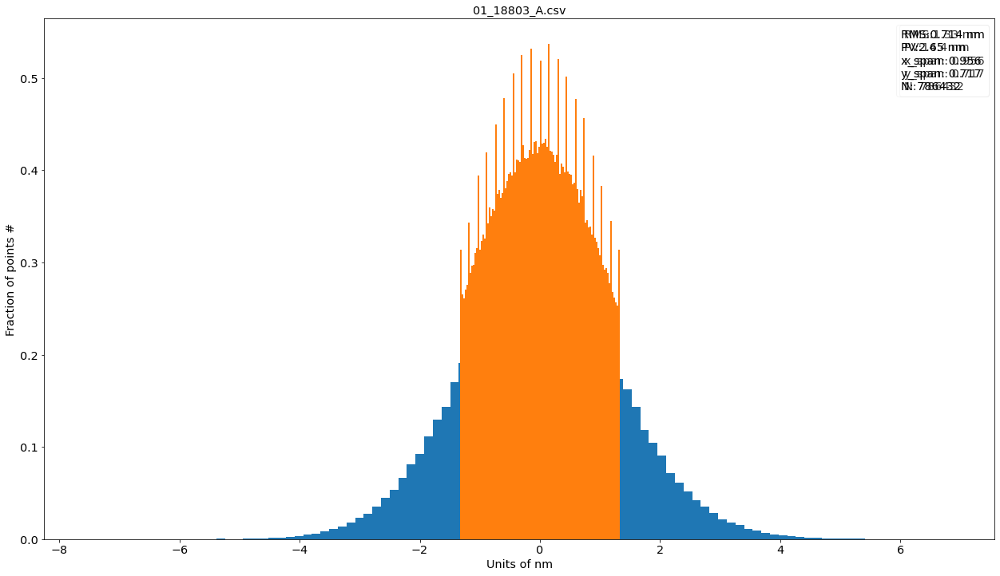

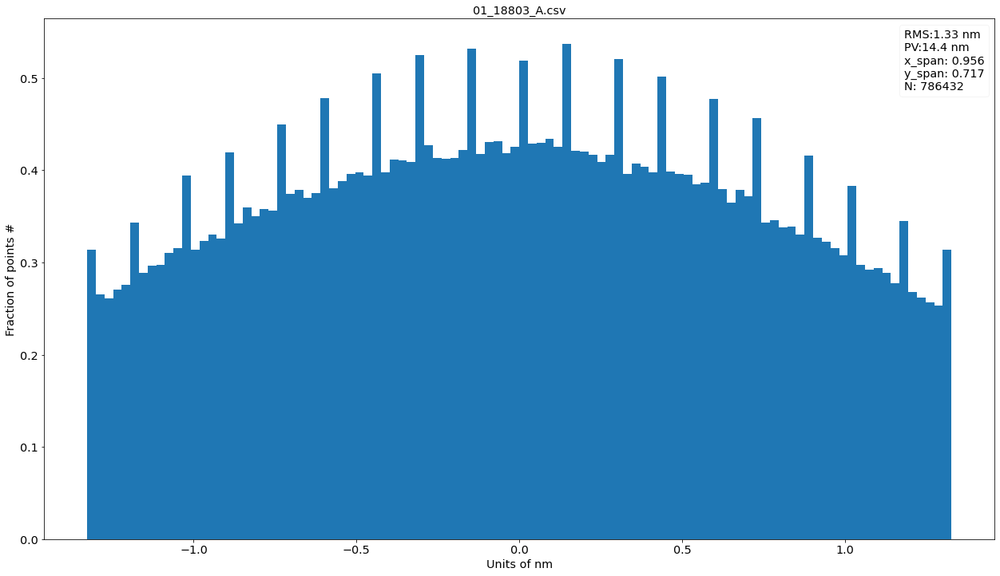

In [117]:
h1 = d.histostats()
h2 = d.remove_outliers(nsigma=1).histostats()  #i picchi vengono fuori dal non aver lasciato gli stessi bin di prima, ma perche'?
plt.figure()
d.histostats(bins=h2[1]) #ci sarebbero anche su h1 se plottato con stessi bins


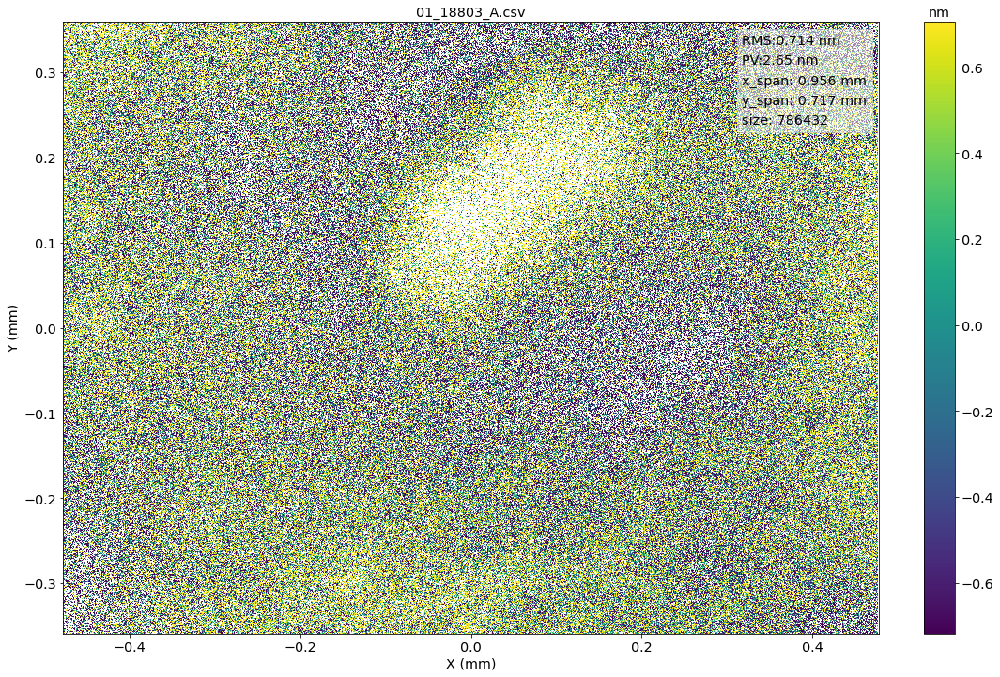

In [106]:
dd = d.remove_outliers(nsigma=1)
dd.plot()

Ci sono funzionalita' piu' complicate, tipo iterare o livellare.


In [92]:
%qtconsole

In [91]:
res=d.copy()
res.data

array([[-3.683  , -0.3302 , -2.1082 , ..., -0.9525 ,      nan,      nan],
       [ 2.8067 ,  0.9144 , -2.55905, ..., -0.01905,      nan,      nan],
       [-1.2192 , -1.1938 , -1.47955, ...,  1.46685,      nan,      nan],
       ...,
       [ 0.8128 ,  0.51435,  1.78435, ..., -0.04445,      nan,      nan],
       [ 2.2987 ,  0.60325, -1.02235, ...,  0.83185,      nan,      nan],
       [ 2.159  , -0.34925,  1.5367 , ..., -1.75895,      nan,      nan]])

To show some complex analysis:

C:\Users\kovor\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


<Figure size 1536x864 with 0 Axes>

> c:\users\kovor\documents\python\pyxtel\pysurf\psd2d.py(374)psd2d_analysis()
-> mask=np.isfinite(rms)


(Pdb)  c


C:\Users\kovor\Documents\python\pyXTel\pySurf\data2D.py:771: RuntimeWarning: invalid value encountered in greater
  data[((data>zrange[1]) | (data<zrange[0]))]=np.nan
C:\Users\kovor\Documents\python\pyXTel\pySurf\data2D.py:771: RuntimeWarning: invalid value encountered in less
  data[((data>zrange[1]) | (data<zrange[0]))]=np.nan
C:\Users\kovor\Anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


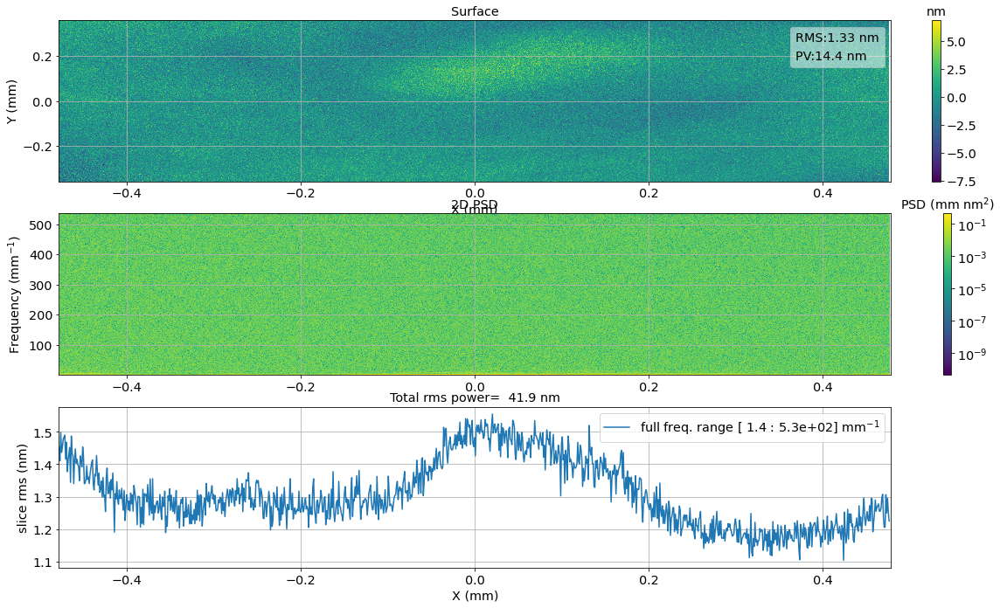

In [67]:
d.psd(analysis=True,title='')
plt.show()

Spiego i tre pannelli. Notare le unita' di misura (questo perche' avevo definito units in inizializzazione).
Pero' puo' essere migliorato. I don't like the color range of PSD.

C:\Users\kovor\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


<Figure size 1536x864 with 0 Axes>

> c:\users\kovor\documents\python\pyxtel\pysurf\psd2d.py(374)psd2d_analysis()
-> mask=np.isfinite(rms)


(Pdb)  c


C:\Users\kovor\Documents\python\pyXTel\pySurf\data2D.py:771: RuntimeWarning: invalid value encountered in greater
  data[((data>zrange[1]) | (data<zrange[0]))]=np.nan
C:\Users\kovor\Documents\python\pyXTel\pySurf\data2D.py:771: RuntimeWarning: invalid value encountered in less
  data[((data>zrange[1]) | (data<zrange[0]))]=np.nan
C:\Users\kovor\Anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


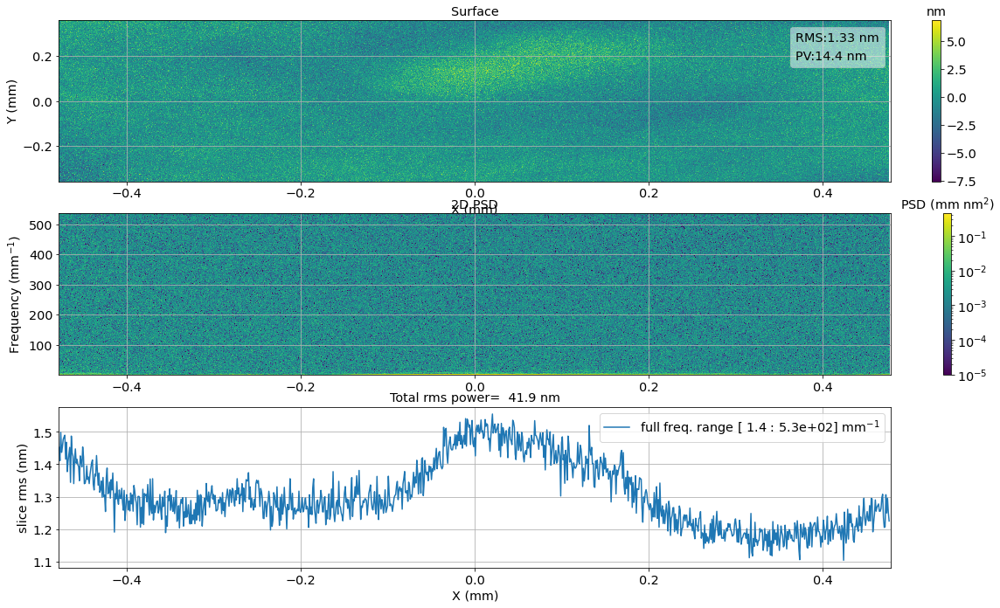

In [68]:
d.psd(analysis=True,title='',prange=[1e-5,None])
plt.show()

<Figure size 1536x864 with 0 Axes>

C:\Users\kovor\Documents\python\pyXTel\pySurf\psd2d.py:156: RuntimeWarning: Mean of empty slice
  plt.title(ax3.get_title()+' [%4.2g : %4.2g]:%4.2g '%(fr[0],fr[1],np.nanmean(rms)))


IndexError: too many indices for array

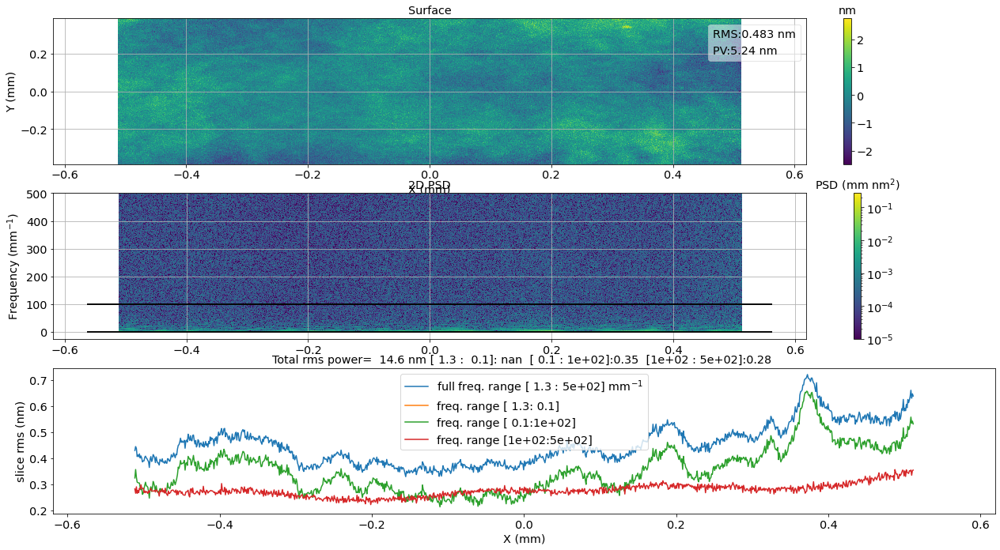

In [95]:
d.psd(analysis=True,title='',prange=[1e-5,None],rmsrange=[[None,0.1],[0.1,100],[100,None]])
plt.show()


In [ ]:
Notare valori rms per banda sopra grafico.

Mostra come i valori ritornati sono psd che possono essere plottate sullo stesso grafico.
Mostra opzioni proiezione psd.

## Altre analisi
- crop 
- leveling
- allineamento

## bonus (pubblicità)
- altre funzioni utili: fn_add_subfix, span